In [1]:
# %load include/header.py
import numpy as np
import matplotlib.pyplot as plt
import sys
from tqdm import trange,tqdm
sys.path.append('./include')
import ml4s
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
plt.style.use('./include/notebook.mplstyle')
np.set_printoptions(linewidth=120)
ml4s._set_css_style('./include/bootstrap.css')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import datetime

from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import train_test_split

import statistics as stat
from collections import Counter

import heapq

In [2]:
gamma_events = []

neutron_events = []

with open("gamma_pulses_medium.txt", "r") as data_file:
    
    for line in data_file:
        
        stripped_line = line.strip("\n").strip()
        
        list_line = stripped_line.split("\t")
        
        one_event = []
        
        for i in list_line:
            
            one_event.append(float(i))
        
        gamma_events.append(one_event)

with open("neutron_pulses_medium.txt", "r") as data_file:
    
    for line in data_file:
        
        stripped_line = line.strip("\n").strip()
        
        list_line = stripped_line.split("\t")
        
        one_event = []
        
        for i in list_line:
            
            one_event.append(float(i))
        
        neutron_events.append(one_event)
        
#plt.hist(gamma_events[0], 200)

#plt.hist(neutron_events[0], 200)

#plt.show()

first_half_events = []

first_half_labels = []

second_half_events = []

second_half_labels = []

for i in range(len(gamma_events)):
    
    r = np.random.choice([0, 1])
    
    if (r == 0):
        
        first_half_events.append(gamma_events[i])
        
        first_half_labels.append(0)
        
        second_half_events.append(neutron_events[i])
        
        second_half_labels.append(1)
        
        #plt.hist(gamma_events[i], 200)
        
    else:
        
        first_half_events.append(neutron_events[i])
        
        first_half_labels.append(1)
        
        second_half_events.append(gamma_events[i])
        
        second_half_labels.append(0)
        
        #plt.hist(neutron_events[i], 200)

all_events = first_half_events + second_half_events

all_labels = np.array(first_half_labels + second_half_labels)

all_events_1 = np.array(all_events)

all_events_2 = np.array(all_events)

all_events_3 = np.array(all_events)

#plt.show()

In [35]:
x_train, x_test, y_train, y_test = train_test_split(all_events_1, all_labels, test_size=0.1)

model = keras.Sequential(
[
    layers.Embedding(input_dim=len(gamma_events[0]), output_dim=64),
    layers.Dense(100, activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.SimpleRNN(100, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])
model.summary()

model.compile(loss=keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy']) 

batch_size = 64
epochs = 20

training_history = {}
training_history['test'] = model.fit(x_train, y_train, epochs=epochs, 
                                     validation_data=(x_test,y_test), verbose=1)

# look into training history
fig,ax = plt.subplots(2,1, sharex=True, sharey=True, figsize=(5,5))

# summarize history for accuracy
ax[0].plot(training_history['test'].history['accuracy'])
ax[0].plot(training_history['test'].history['val_accuracy'], ls='--', color=colors[-3])
ax[0].set_ylabel('model accuracy')
ax[0].legend(['train', 'test'], loc='best')
ax[0].set_ylim(0,1)

# summarize history for loss
ax[1].plot(training_history['test'].history['loss'])
ax[1].plot(training_history['test'].history['val_loss'], ls='--', color=colors[-3])
ax[1].set_ylabel('model loss')
ax[1].set_xlabel('epoch')
ax[1].legend(['train', 'test'], loc='best');

# evaluate model
score = model.evaluate(x_test, y_test, verbose=2)

all_events_1 = np.array(all_events_1)

predictions_1 = np.zeros(all_events_1.shape[0],dtype=int)
predictions_1[np.where(model(all_events_1)>=0.5)[0]] = 1

mistakes_1 = np.where(all_labels != predictions_1)[0]
num_mistakes_1 = len(mistakes_1)

print(f'Num. Mistakes  = {num_mistakes_1}')

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 64)          12800     
_________________________________________________________________
dense_30 (Dense)             (None, None, 100)         6500      
_________________________________________________________________
dense_31 (Dense)             (None, None, 100)         10100     
_________________________________________________________________
simple_rnn (SimpleRNN)       (None, 100)               20100     
_________________________________________________________________
dense_32 (Dense)             (None, 1)                 101       
Total params: 49,601
Trainable params: 49,601
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20


InvalidArgumentError:  indices[31,24] = 399 is not in [0, 200)
	 [[node sequential_6/embedding/embedding_lookup (defined at <ipython-input-35-4128b1a959e0>:19) ]] [Op:__inference_train_function_161303]

Errors may have originated from an input operation.
Input Source operations connected to node sequential_6/embedding/embedding_lookup:
 sequential_6/embedding/embedding_lookup/160634 (defined at /lustre/haven/proj/UTK0154/local/envs/ml4s/lib/python3.7/contextlib.py:112)

Function call stack:
train_function


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 100)               20100     
_________________________________________________________________
dense_1 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_2 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_3 (Dense)              (None, 50)                5050      
_________________________________________________________________
dropout (Dropout)            (None, 50)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 51        
Total params: 45,401
Trainable params: 45,401
Non-trainable params: 0
____________________________________________________

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


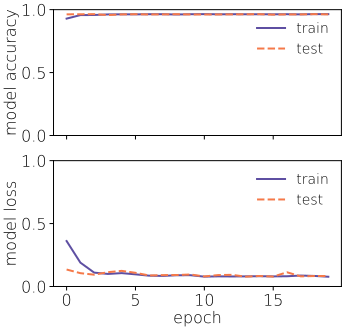

In [3]:
x_train, x_test, y_train, y_test = train_test_split(all_events_1, all_labels, test_size=0.1)

model = keras.Sequential(
[
    layers.Dense(100, input_shape=(len(gamma_events[0]),), activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dense(50, activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(1, activation='sigmoid')
])
model.summary()

model.compile(loss=keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy']) 

batch_size = 64
epochs = 20

training_history = {}
training_history['test'] = model.fit(x_train, y_train, epochs=epochs, validation_data=(x_test,y_test), verbose=1)

# look into training history
fig,ax = plt.subplots(2,1, sharex=True, sharey=True, figsize=(5,5))

# summarize history for accuracy
ax[0].plot(training_history['test'].history['accuracy'])
ax[0].plot(training_history['test'].history['val_accuracy'], ls='--', color=colors[-3])
ax[0].set_ylabel('model accuracy')
ax[0].legend(['train', 'test'], loc='best')
ax[0].set_ylim(0,1)

# summarize history for loss
ax[1].plot(training_history['test'].history['loss'])
ax[1].plot(training_history['test'].history['val_loss'], ls='--', color=colors[-3])
ax[1].set_ylabel('model loss')
ax[1].set_xlabel('epoch')
ax[1].legend(['train', 'test'], loc='best');

# evaluate model
score = model.evaluate(x_test, y_test, verbose=2)

all_events_1 = np.array(all_events_1)

predictions_1 = np.zeros(all_events_1.shape[0],dtype=int)
predictions_1[np.where(model(all_events_1)>=0.5)[0]] = 1

mistakes_1 = np.where(all_labels != predictions_1)[0]
num_mistakes_1 = len(mistakes_1)

print(f'Num. Mistakes  = {num_mistakes_1}')

#How to get probabilities out?

#What to do at end of nonbinary classification NN?

#I have to rerun everything every time

#No matter what I do, I always get 96% accuracy with medium quality data and 99.8% accuracy with good quality data
#Wide NN a little better for good quality data, maybe

#Data augmentation (adding random noise to data), Recurrent neural networks (RNN) might help

#Majority rule (train three different neural networks, with same archetecture, take majority prediction)

#Look at mistakes

#Adding dropout layer helped a tiny bit, increased accuracy to 97%

#How do I check weight and bias values?

#Find misclassification fraction as a function of light intensity (long gate)

#Convert FOM into misclassification fraction

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 100)               20100     
_________________________________________________________________
dense_6 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_7 (Dense)              (None, 100)               10100     
_________________________________________________________________
dense_8 (Dense)              (None, 50)                5050      
_________________________________________________________________
dropout_1 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 51        
Total params: 45,401
Trainable params: 45,401
Non-trainable params: 0
__________________________________________________

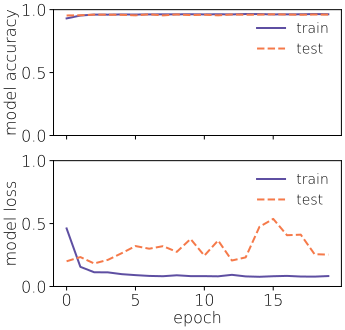

In [4]:
x_train, x_test, y_train, y_test = train_test_split(all_events_2, all_labels, test_size=0.1)

model = keras.Sequential(
[
    layers.Dense(100, input_shape=(len(gamma_events[0]),), activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dense(50, activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(1, activation='sigmoid')
])
model.summary()

model.compile(loss=keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy']) 

batch_size = 64
epochs = 20

training_history = {}
training_history['test'] = model.fit(x_train, y_train, epochs=epochs, validation_data=(x_test,y_test), verbose=1)

# look into training history
fig,ax = plt.subplots(2,1, sharex=True, sharey=True, figsize=(5,5))

# summarize history for accuracy
ax[0].plot(training_history['test'].history['accuracy'])
ax[0].plot(training_history['test'].history['val_accuracy'], ls='--', color=colors[-3])
ax[0].set_ylabel('model accuracy')
ax[0].legend(['train', 'test'], loc='best')
ax[0].set_ylim(0,1)

# summarize history for loss
ax[1].plot(training_history['test'].history['loss'])
ax[1].plot(training_history['test'].history['val_loss'], ls='--', color=colors[-3])
ax[1].set_ylabel('model loss')
ax[1].set_xlabel('epoch')
ax[1].legend(['train', 'test'], loc='best');

# evaluate model
score = model.evaluate(x_test, y_test, verbose=2)

all_events_2 = np.array(all_events_2)

predictions_2 = np.zeros(all_events_2.shape[0],dtype=int)
predictions_2[np.where(model(all_events_2)>=0.5)[0]] = 1

mistakes_2 = np.where(all_labels != predictions_2)[0]
num_mistakes_2 = len(mistakes_2)

print(f'Num. Mistakes  = {num_mistakes_2}')

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_10 (Dense)             (None, 100)               20100     
_________________________________________________________________
dense_11 (Dense)             (None, 100)               10100     
_________________________________________________________________
dense_12 (Dense)             (None, 100)               10100     
_________________________________________________________________
dense_13 (Dense)             (None, 50)                5050      
_________________________________________________________________
dropout_2 (Dropout)          (None, 50)                0         
_________________________________________________________________
dense_14 (Dense)             (None, 1)                 51        
Total params: 45,401
Trainable params: 45,401
Non-trainable params: 0
__________________________________________________

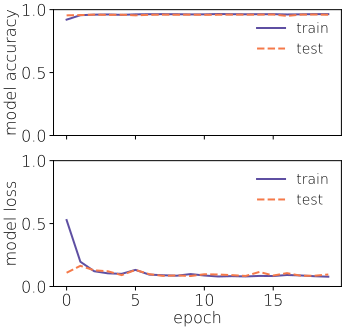

In [5]:
x_train, x_test, y_train, y_test = train_test_split(all_events_3, all_labels, test_size=0.1)

model = keras.Sequential(
[
    layers.Dense(100, input_shape=(len(gamma_events[0]),), activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dense(100, activation='relu'),
    layers.Dense(50, activation='relu'),
    layers.Dropout(0.25),
    layers.Dense(1, activation='sigmoid')
])
model.summary()

model.compile(loss=keras.losses.binary_crossentropy, optimizer='adam', metrics=['accuracy']) 

batch_size = 64
epochs = 20

training_history = {}
training_history['test'] = model.fit(x_train, y_train, epochs=epochs, validation_data=(x_test,y_test), verbose=1)

# look into training history
fig,ax = plt.subplots(2,1, sharex=True, sharey=True, figsize=(5,5))

# summarize history for accuracy
ax[0].plot(training_history['test'].history['accuracy'])
ax[0].plot(training_history['test'].history['val_accuracy'], ls='--', color=colors[-3])
ax[0].set_ylabel('model accuracy')
ax[0].legend(['train', 'test'], loc='best')
ax[0].set_ylim(0,1)

# summarize history for loss
ax[1].plot(training_history['test'].history['loss'])
ax[1].plot(training_history['test'].history['val_loss'], ls='--', color=colors[-3])
ax[1].set_ylabel('model loss')
ax[1].set_xlabel('epoch')
ax[1].legend(['train', 'test'], loc='best');

# evaluate model
score = model.evaluate(x_test, y_test, verbose=2)

all_events_3 = np.array(all_events_3)

predictions_3 = np.zeros(all_events_3.shape[0],dtype=int)
predictions_3[np.where(model(all_events_3)>=0.5)[0]] = 1

mistakes_3 = np.where(all_labels != predictions_3)[0]
num_mistakes_3 = len(mistakes_3)

print(f'Num. Mistakes  = {num_mistakes_3}')

In [6]:
predictions_f = []

for i in range(len(predictions_1)):
    
    temp = predictions_1[i] + predictions_2[i] + predictions_3[i]
    
    if temp >= 2:
        
        predictions_f.append(1)
        
    else:
        
        predictions_f.append(0)
        
mistakes_f = np.where(all_labels != predictions_f)[0]
num_mistakes_f = len(mistakes_f)

print(f'Num. Mistakes  = {num_mistakes_f}')

print(mistakes_f)

Num. Mistakes  = 666
[   10    27    59    80   142   171   173   200   204   249   269   293   321   360   386   417   423   472   548
   565   581   613   669   730   737   792   800   871   886   911   913   948   955   961   983  1003  1044  1053
  1060  1080  1102  1114  1120  1125  1145  1324  1348  1356  1369  1390  1423  1442  1527  1537  1539  1553  1563
  1573  1579  1616  1632  1637  1644  1684  1696  1731  1741  1749  1757  1793  1822  1846  1902  1903  1963  1973
  1991  2002  2021  2063  2064  2110  2128  2181  2268  2338  2391  2413  2416  2483  2522  2526  2529  2561  2563
  2583  2604  2606  2668  2691  2707  2714  2717  2757  2806  2847  2848  2933  2956  3001  3046  3057  3080  3108
  3116  3118  3157  3299  3344  3355  3427  3541  3550  3558  3570  3588  3602  3649  3667  3714  3816  3886  3955
  3992  4042  4121  4151  4200  4204  4250  4314  4321  4354  4396  4417  4471  4485  4552  4589  4603  4639  4656
  4658  4682  4760  4782  4785  4874  4912  4922  4951  499

In [7]:
print(mistakes_1)

print(mistakes_2)

print(mistakes_3)

[   10    27    59    75   142   171   173   200   204   249   269   293   321   360   386   402   417   423   450
   472   548   565   581   613   669   730   737   792   800   871   911   913   948   955   961   983  1003  1044
  1053  1060  1080  1102  1114  1120  1125  1145  1192  1306  1324  1348  1356  1369  1390  1423  1425  1442  1527
  1537  1553  1563  1573  1579  1616  1632  1637  1644  1684  1696  1731  1741  1749  1757  1793  1822  1846  1903
  1941  1963  1973  1991  2002  2021  2032  2063  2064  2110  2128  2181  2268  2338  2391  2413  2416  2483  2522
  2526  2529  2561  2563  2583  2604  2606  2640  2691  2707  2714  2717  2757  2806  2847  2848  2933  2943  2956
  3001  3046  3057  3080  3108  3116  3118  3157  3251  3261  3262  3299  3344  3355  3427  3541  3550  3558  3570
  3578  3588  3602  3649  3667  3714  3816  3846  3886  3955  4021  4042  4059  4121  4151  4200  4204  4250  4314
  4321  4347  4354  4396  4417  4471  4485  4552  4589  4603  4610  4639  4656  

In [80]:
model.get_weights()

[array([[ 0.15349564, -0.07759169, -0.04601398, ..., -0.11811907, -0.16088074, -0.25809637],
        [ 0.0605505 , -0.23329832, -0.06230513, ...,  0.14658853, -0.01688756, -0.24390693],
        [-0.04792737, -0.14173256, -0.01450164, ...,  0.10490422,  0.05263657,  0.26122048],
        ...,
        [ 0.06029334, -0.05440596, -0.08840644, ..., -0.13784888, -0.10736638, -0.00358912],
        [ 0.13742976,  0.11575355, -0.13768765, ...,  0.02829425,  0.02781126, -0.08029445],
        [ 0.17323479,  0.04943855, -0.13777055, ..., -0.08605996,  0.01660756,  0.09023077]], dtype=float32),
 array([-0.01625746, -0.08585874, -0.03335604, -0.32629135, -0.04387166, -0.03566067, -0.01318182, -0.30304557,
        -0.3159011 ,  0.05403144,  0.06307714, -0.00691421, -0.02354622,  0.00200203, -0.02478696, -0.07288083,
        -0.03657187, -0.40441096, -0.31935418, -0.02662971, -0.2856577 , -0.04693618, -0.04392515, -0.2694001 ,
         0.04342422,  0.43268234,  0.04743506, -0.70114774, -0.02809309,  0.

In [81]:
print(model(all_events_1).numpy())

[[7.8242141e-17]
 [9.9786603e-01]
 [3.2685566e-01]
 ...
 [6.3391442e-24]
 [4.5048711e-01]
 [9.6021861e-01]]


In [20]:
print(model(all_events_1))

print(model(all_events_2))

print(model(all_events_3))

#These are not the probs that I need

tf.Tensor(
[[2.5105707e-21]
 [9.9991179e-01]
 [7.6798534e-01]
 ...
 [1.0000000e+00]
 [9.7289026e-01]
 [9.7721016e-01]], shape=(20000, 1), dtype=float32)
tf.Tensor(
[[2.5105707e-21]
 [9.9991179e-01]
 [7.6798534e-01]
 ...
 [1.0000000e+00]
 [9.7289026e-01]
 [9.7721016e-01]], shape=(20000, 1), dtype=float32)
tf.Tensor(
[[2.5105707e-21]
 [9.9991179e-01]
 [7.6798534e-01]
 ...
 [1.0000000e+00]
 [9.7289026e-01]
 [9.7721016e-01]], shape=(20000, 1), dtype=float32)


In [16]:
test=np.array(x_train)

In [19]:
model(test[:10,:])

<tf.Tensor: shape=(10, 1), dtype=float32, numpy=
array([[5.9418683e-09],
       [9.7417760e-01],
       [5.3089765e-23],
       [1.9374174e-19],
       [9.9941397e-01],
       [9.9073792e-01],
       [9.9996674e-01],
       [7.1265666e-14],
       [5.2620286e-01],
       [2.8247005e-06]], dtype=float32)>

In [ ]:
np.where(model.evaluate(test)<0.5)

In [18]:
test.shape

(18000, 200)

In [11]:
all_short_gates_G = np.array(all_short_gates_G)
all_long_gates_G = np.array(all_long_gates_G)
index   = np.argsort(all_long_gates_G)

all_short_gates_G = list(np.array(all_short_gates_G)[index])
all_long_gates_G = list(np.array(all_long_gates_G)[index])

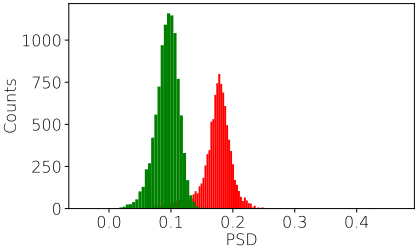

In [4]:
all_short_gates_G = []

all_long_gates_G = []

for i in range(len(gamma_events)):
    
    peak = gamma_events[i].index(max(gamma_events[i]))
    
    if peak <= 49:
    
        short_gate = sum(gamma_events[i][peak + 20 : peak + 150])
            
        all_short_gates_G.append(short_gate)
        
        long_gate = sum(gamma_events[i][peak - 10 : peak + 150])
        
        all_long_gates_G.append(long_gate)

all_short_gates_G = np.array(all_short_gates_G)

all_long_gates_G = np.array(all_long_gates_G)

index = np.argsort(all_long_gates_G)

all_short_gates_G = list(np.array(all_short_gates_G)[index])

all_long_gates_G = list(np.array(all_long_gates_G)[index])

PSD_G = []

for i in range(len(all_short_gates_G)):
    
    PSD_G.append(all_short_gates_G[i] / all_long_gates_G[i])
    

    
all_short_gates_N = []

all_long_gates_N = []

for i in range(len(neutron_events)):
    
    peak = neutron_events[i].index(max(neutron_events[i]))
    
    if peak <= 49:
    
        short_gate = sum(neutron_events[i][peak + 20 : peak + 150])
            
        all_short_gates_N.append(short_gate)
        
        long_gate = sum(neutron_events[i][peak - 10 : peak + 150])
        
        all_long_gates_N.append(long_gate)

all_short_gates_N = np.array(all_short_gates_N)

all_long_gates_N = np.array(all_long_gates_N)

index = np.argsort(all_long_gates_N)

all_short_gates_N = list(np.array(all_short_gates_N)[index])

all_long_gates_N = list(np.array(all_long_gates_N)[index])
        
PSD_N = []

for i in range(len(all_short_gates_N)):
    
    PSD_N.append(all_short_gates_N[i] / all_long_gates_N[i])
    


plt.hist(PSD_G, bins=int(len(PSD_G)/100), color='r')

plt.hist(PSD_N, bins=int(len(PSD_N)/100), color='g')

plt.ylabel('Counts')

plt.xlabel('PSD');

In [5]:
all_long_gates = all_long_gates_G + all_long_gates_N
PSD = PSD_G + PSD_N

plt.hist2d(all_long_gates, PSD, bins=int(len(PSD_G)/50), range = [[0,30000],[0,0.3]], cmap = plt.cm.nipy_spectral)

plt.colorbar()
plt.xlabel('Energy')
plt.ylabel('PSD');

Gamma pulse long gates:    [2435.29, 3345.84, 4624.52, 6179.09, 7917.65, 9795.29, 11952.57, 14177.23, 16520.44, 19267.12]
Neutron pulse long gates:  [2406.22, 3155.33, 4080.56, 5197.38, 6556.76, 7987.0, 9699.28, 11906.1, 14972.68, 20067.38]
FOM:                       [0.37, 0.54, 0.78, 0.91, 1.06, 1.29, 1.57, 1.35, 0.98, 1.25]


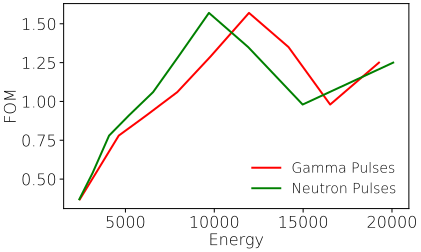

In [6]:
def closest(lst, K):
      
    return lst[min(range(len(lst)), key = lambda i: abs(lst[i]-K))]


long_gate_G_S = []

long_gate_N_S = []

FOM = []

a = 10

for i in range(a):
    
    PSD_G_S = PSD_G[round((len(PSD_G)-1)*(i/a)) : round((len(PSD_G)-1)*((i+1)/a))]

    mu_G = stat.median(PSD_G_S)

    PSD_G_H = np.histogram(PSD_G_S, bins=int(len(PSD_G_S)/50))
    
    mu_G_Ind = int(np.where(PSD_G_H[0] == max(PSD_G_H[0]))[0])
    
    half_max_G_left = closest(PSD_G_H[0][:mu_G_Ind], (max(PSD_G_H[0])/2))
    
    half_max_G_left_Ind = int(np.where(PSD_G_H[0] == half_max_G_left)[0])

    half_max_G_right = closest(PSD_G_H[0][mu_G_Ind:], (max(PSD_G_H[0])/2))

    half_max_G_right_Ind = int(np.where(PSD_G_H[0] == half_max_G_right)[0])

    W_G_L = PSD_G_H[1][half_max_G_left_Ind]

    W_G_R = PSD_G_H[1][half_max_G_right_Ind]

    W_G = W_G_R - W_G_L



    PSD_N_S = PSD_N[round((len(PSD_N)-1)*(i/a)) : round((len(PSD_N)-1)*((i+1)/a))]
    
    mu_N = stat.median(PSD_N_S)

    PSD_N_H = np.histogram(PSD_N_S, bins=int(len(PSD_G_S)/50))

    mu_N_Ind = int(np.where(PSD_N_H[0] == max(PSD_N_H[0]))[0])

    half_max_N_left = closest(PSD_N_H[0][:mu_N_Ind], (max(PSD_N_H[0])/2))

    half_max_N_left_Ind = int(np.where(PSD_N_H[0] == half_max_N_left)[0])

    half_max_N_right = closest(PSD_N_H[0][mu_N_Ind:], (max(PSD_N_H[0])/2))

    half_max_N_right_Ind = int(np.where(PSD_N_H[0] == half_max_N_right)[0])

    W_N_L = PSD_N_H[1][half_max_N_left_Ind]

    W_N_R = PSD_N_H[1][half_max_N_right_Ind]

    W_N = W_N_R - W_N_L



    all_long_gates_G_S = all_long_gates_G[round((len(PSD_G)-1)*(i/a)) : round((len(PSD_G)-1)*((i+1)/a))]
    
    all_long_gates_N_S = all_long_gates_N[round((len(PSD_G)-1)*(i/a)) : round((len(PSD_G)-1)*((i+1)/a))]
    
    long_gate_G_S.append(round(stat.mean(all_long_gates_G_S),2))
    
    long_gate_N_S.append(round(stat.mean(all_long_gates_N_S),2))
    
    FOM.append(round(abs(mu_N - mu_G) / (W_N + W_G),2))



print("Gamma pulse long gates:   ", long_gate_G_S)

print("Neutron pulse long gates: ", long_gate_N_S)

print("FOM:                      ", FOM)



plt.plot(long_gate_G_S, FOM, color='r', label='Gamma Pulses')

plt.plot(long_gate_N_S, FOM, color='g', label='Neutron Pulses')

plt.xlabel('Energy')

plt.ylabel('FOM')

plt.legend();



#Put FOM as function of energy (long gate)

#Take a bunch of slices along energy (long gate)

#Graph FOM vs energy



#Find mean of long gate?

#Long gate of gamma or neutron pulses?

#How many slices? How big should slices be?

In [4]:
over500keV_events = []

with open("pulses_over500keV.txt", "r") as data_file:
    
    for line in data_file:
        
        stripped_line = line.strip("\n").strip()
        
        list_line = stripped_line.split("\t")
        
        one_event = []
        
        for i in list_line:
            
            one_event.append(float(i))
        
        over500keV_events.append(one_event)

In [5]:
model.predict(over500keV_events)

array([[1.3373073e-28],
       [2.4282442e-12],
       [5.0619847e-01],
       ...,
       [1.0644089e-08],
       [9.8266184e-01],
       [9.5853429e-05]], dtype=float32)

In [12]:
model.evaluate(over500keV_events)

#Useful if you have data with labels

1563/1563 [==============================] - 2s 1ms/step - loss: 0.0000e+00 - accuracy: 0.0000e+00


[0.0, 0.0]

In [6]:
logreg = LogisticRegression(C=1e5, max_iter=10000)

logreg.fit(all_events, all_labels)

performance = logreg.score(all_events, all_labels)

print("Performance of logistic regression:", performance)

Performance of logistic regression: 0.95695


20 samples after peak to 100 samples after peak  is short gate / 
10 samples before the peak to 100 samples after the peak is long gate / 
Integrate by adding up all samples in gate (including negative values) / 

sklearn gridsearchcv / 
https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html / 
https://scikit-learn.org/stable/modules/grid_search.html